In [2]:
import pandas as pd
import numpy as np
import pylab as py
import seaborn as sns
from pandas_profiling import ProfileReport

In [3]:
train=pd.read_csv('Train(2)+zindi.csv')
test=pd.read_csv('Test(2)+zindi.csv')
submit=pd.read_csv('SampleSubmission+zindi.csv')

In [4]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [5]:
target=[]
for i in train.columns:
    if i not in test.columns:
        target.append(i)
        print(target)

['Response']


In [6]:
target

['Response']

In [7]:
mis=[col for col in train.columns if train[col].isnull().any()]

In [8]:
mis

['Disposable_Income']

In [9]:
train.isnull().sum()

ID                          0
Year_of_Birth               0
Education_Level             0
Marital_Status              0
Disposable_Income          16
No_of_Kids_in_home          0
No_of_Teen_in_home          0
Date_Customer               0
Recency                     0
Discounted_Purchases        0
WebPurchases                0
CatalogPurchases            0
StorePurchases              0
Amount_on_Wines             0
Amount_on_Fruits            0
Amount_on_MeatProducts      0
Amount_on_FishProducts      0
Amount_on_SweetProducts     0
Amount_on_GoldProds         0
WebVisitsMonth              0
Cmp3Accepted                0
Cmp4Accepted                0
Cmp5Accepted                0
Cmp1Accepted                0
Cmp2Accepted                0
Any_Complain                0
Response                    0
dtype: int64

In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1568 entries, 0 to 1567
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       1568 non-null   object 
 1   Year_of_Birth            1568 non-null   int64  
 2   Education_Level          1568 non-null   object 
 3   Marital_Status           1568 non-null   object 
 4   Disposable_Income        1552 non-null   float64
 5   No_of_Kids_in_home       1568 non-null   int64  
 6   No_of_Teen_in_home       1568 non-null   int64  
 7   Date_Customer            1568 non-null   object 
 8   Recency                  1568 non-null   int64  
 9   Discounted_Purchases     1568 non-null   int64  
 10  WebPurchases             1568 non-null   int64  
 11  CatalogPurchases         1568 non-null   int64  
 12  StorePurchases           1568 non-null   int64  
 13  Amount_on_Wines          1568 non-null   int64  
 14  Amount_on_Fruits        

In [11]:
train.describe()

,Year_of_Birth,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
count,1568.000000,1552.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,...,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000,1568.000000
mean,1970.073342,62381.186598,0.460459,0.497449,55.408801,2.292730,4.001276,2.665816,5.703444,303.190051,...,26.800383,43.739158,5.326531,0.072704,0.072704,0.080357,0.064413,0.012755,0.008291,0.152423
std,11.920781,32089.169563,0.540361,0.544151,28.788037,1.937544,2.773748,3.043493,3.260553,340.141396,...,40.857657,51.591557,2.468023,0.259733,0.259733,0.271932,0.245566,0.112252,0.090705,0.359546
min,1900.000000,2076.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1960.000000,41612.400000,0.000000,0.000000,31.000000,1.000000,2.000000,0.000000,3.000000,27.000000,...,1.000000,8.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1971.000000,60964.200000,0.000000,0.000000,56.000000,2.000000,3.000000,2.000000,5.000000,167.000000,...,8.000000,25.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1979.000000,81493.200000,1.000000,1.000000,80.000000,3.000000,6.000000,4.000000,8.000000,499.500000,...,33.000000,56.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1997.000000,799999.200000,2.000000,2.000000,106.000000,15.000000,27.000000,28.000000,13.000000,1498.000000,...,263.000000,362.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
train.profile_report()

<AxesSubplot:>

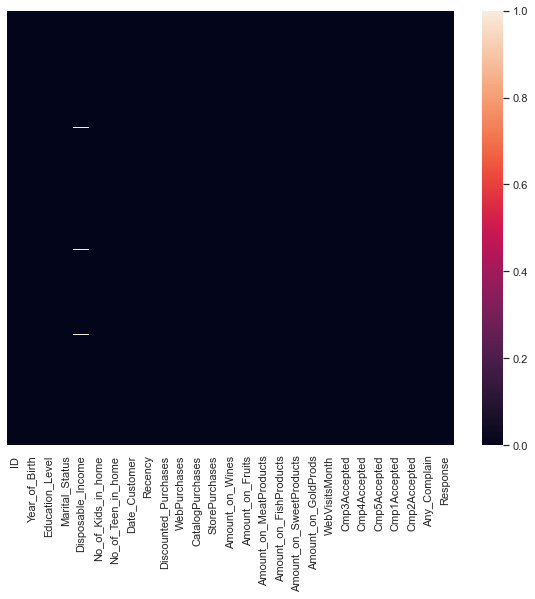

In [13]:
fig=py.figure(figsize=(10,8))
sns.set(style='darkgrid')
sns.heatmap(train.isnull(),yticklabels=False)

In [14]:
train.columns


Index(['ID', 'Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Date_Customer', 'Recency', 'Discounted_Purchases', 'WebPurchases',
       'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines',
       'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Response'],
      dtype='object')

In [15]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [16]:
train.corr()

,Year_of_Birth,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
Year_of_Birth,1.000000,-0.169006,0.242429,-0.353991,-0.014155,-0.061246,-0.165289,-0.140005,-0.159045,-0.191037,...,-0.044336,-0.071109,0.135795,0.067942,-0.065205,-0.012450,0.002963,0.007885,0.002978,0.012279
Disposable_Income,-0.169006,1.000000,-0.420914,0.021720,-0.006822,-0.066990,0.380671,0.553196,0.490041,0.541937,...,0.418429,0.320388,-0.530072,-0.016061,0.169711,0.333425,0.259968,0.082295,-0.029043,0.130254
No_of_Kids_in_home,0.242429,-0.420914,1.000000,-0.048091,0.008404,0.211293,-0.384441,-0.508997,-0.521173,-0.519091,...,-0.384115,-0.372180,0.450402,0.020496,-0.165929,-0.225912,-0.170760,-0.086368,0.026223,-0.108558
No_of_Teen_in_home,-0.353991,0.021720,-0.048091,1.000000,0.014712,0.373262,0.155173,-0.088757,0.073129,0.005626,...,-0.140542,-0.013651,0.125594,-0.057385,0.055496,-0.209937,-0.158758,-0.009915,0.006894,-0.156209
Recency,-0.014155,-0.006822,0.008404,0.014712,1.000000,-0.006311,-0.026068,0.029136,-0.008498,0.019051,...,0.034841,-0.000920,-0.022179,-0.018657,0.004643,0.005828,-0.040377,-0.028077,0.020208,-0.201654
Discounted_Purchases,-0.061246,-0.066990,0.211293,0.373262,-0.006311,1.000000,0.204052,0.026556,0.058702,-0.001913,...,-0.102849,0.046953,0.333250,-0.037245,0.019819,-0.191230,-0.121472,-0.028915,-0.013818,0.000951
WebPurchases,-0.165289,0.380671,-0.384441,0.155173,-0.026068,0.204052,1.000000,0.361998,0.518604,0.530179,...,0.394216,0.419859,-0.088528,0.029988,0.128313,0.142003,0.145100,0.024543,-0.015261,0.165538
CatalogPurchases,-0.140005,0.553196,-0.508997,-0.088757,0.029136,0.026556,0.361998,1.000000,0.497271,0.630364,...,0.476969,0.429251,-0.525378,0.098568,0.126016,0.340899,0.297788,0.094675,-0.024632,0.221534
StorePurchases,-0.159045,0.490041,-0.521173,0.073129,-0.008498,0.058702,0.518604,0.497271,1.000000,0.647018,...,0.440027,0.407657,-0.426029,-0.058922,0.172418,0.233461,0.202406,0.088803,-0.013259,0.061446
Amount_on_Wines,-0.191037,0.541937,-0.519091,0.005626,0.019051,-0.001913,0.530179,0.630364,0.647018,1.000000,...,0.383789,0.405581,-0.338141,0.073176,0.374574,0.509900,0.371342,0.207473,-0.031781,0.259173


In [17]:
train['Education_Level'].value_counts()

Graduation    802
PhD           340
Master        246
2n Cycle      142
Basic          38
Name: Education_Level, dtype: int64

In [18]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [19]:
train.Marital_Status.value_counts()

Married     615
Together    409
Single      329
Divorced    159
Widow        50
Alone         3
YOLO          2
Absurd        1
Name: Marital_Status, dtype: int64

In [20]:
type(train['Date_Customer'].loc[1])

str

In [21]:
train['Date_Customer']=pd.to_datetime(train['Date_Customer'])
test['Date_Customer']=pd.to_datetime(test['Date_Customer'])

In [22]:
day=train.Date_Customer.loc[40]

In [23]:
day.year

2013

In [24]:
day.dayofweek

3

In [25]:
day.day_name()

'Thursday'

In [26]:
day.month_name()

'February'

In [27]:
def day_1(yer):
    return yer.year
def day_2(day_ne):
    return day_ne.day_name()
def day_3(month_):
    return month_.month_name()


In [28]:
train[['year','day_name','month']]=train['Date_Customer'].apply([day_1,day_2,day_3])

In [29]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,year,day_name,month
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,0,0,0,0,0,0,0,2014,Sunday,June
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,0,0,0,0,0,0,0,2013,Tuesday,January
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,0,0,0,1,0,0,1,2013,Thursday,November
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,2013-09-13,49,3,...,0,0,0,0,0,0,0,2013,Friday,September
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,0,0,0,1,0,0,0,2014,Tuesday,January


<AxesSubplot:xlabel='day_name'>

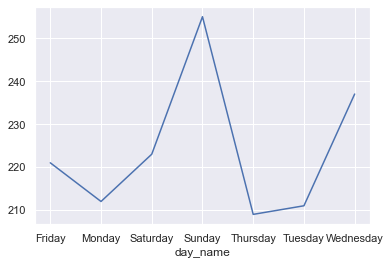

In [30]:
train.groupby('day_name').count()['ID'].plot()

In [31]:
test[['year','day_name','month']]=test['Date_Customer'].apply([day_1,day_2,day_3])

In [32]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,year,day_name,month
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,0,0,0,0,0,0,0,2014,Sunday,June
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,0,0,0,0,0,0,0,2013,Tuesday,January
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,0,0,0,1,0,0,1,2013,Thursday,November
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,2013-09-13,49,3,...,0,0,0,0,0,0,0,2013,Friday,September
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,0,0,0,1,0,0,0,2014,Tuesday,January


In [33]:
train[train['Disposable_Income'].isnull()]

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,year,day_name,month
128,ID_2ZFDRTZK,1970,Master,Together,NaN,1,1,2013-05-18,59,7,...,0,0,0,0,0,0,0,2013,Saturday,May
155,ID_0Q6ZGI80,1960,PhD,Single,NaN,0,0,2013-05-11,87,1,...,0,0,0,0,0,0,0,2013,Saturday,May
166,ID_3RPO0ZH5,1979,2n Cycle,Together,NaN,0,0,2012-12-08,60,0,...,0,1,0,0,0,0,0,2012,Saturday,December
288,ID_LVEIIFN2,1983,Graduation,Single,NaN,1,0,2013-06-17,64,2,...,0,0,0,0,0,0,0,2013,Monday,June
423,ID_LZNSOQRD,1990,Graduation,Married,NaN,0,0,2013-03-06,76,1,...,0,1,0,1,0,0,0,2013,Wednesday,March
462,ID_EVQSLYK9,1984,Graduation,Married,NaN,1,0,2013-11-15,18,1,...,0,0,0,0,0,0,0,2013,Friday,November
552,ID_B585A0J8,1971,Graduation,Single,NaN,1,2,2013-08-23,74,6,...,0,1,0,1,0,0,0,2013,Friday,August
562,ID_X42EP1QB,1955,Master,Together,NaN,0,1,2013-06-23,90,2,...,0,0,0,0,0,0,0,2013,Sunday,June
588,ID_SEOQWEOJ,1973,PhD,Together,NaN,1,0,2014-02-03,24,1,...,0,0,0,0,0,0,0,2014,Monday,February
642,ID_O6ZRF42T,1987,Graduation,Single,NaN,1,0,2013-02-20,26,0,...,0,0,0,0,0,0,0,2013,Wednesday,February


<AxesSubplot:xlabel='year', ylabel='count'>

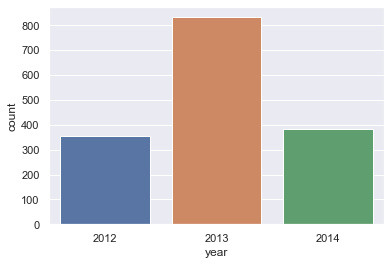

In [34]:
sns.countplot(x='year',data=train)

<AxesSubplot:xlabel='Marital_Status', ylabel='Disposable_Income'>

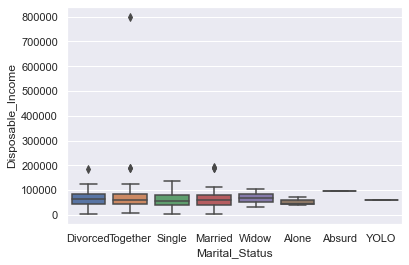

In [35]:
sns.boxplot(x='Marital_Status',y='Disposable_Income',data=train)

In [36]:
train.groupby('year')['Disposable_Income'].mean()

year
2012    61121.904274
2013    62823.956044
2014    62588.987435
Name: Disposable_Income, dtype: float64

In [37]:
def Dispose(col):
    Disposable_Income=col[0]
    year=col[1]
    if pd.isnull(Disposable_Income):
        if year ==2012:
            return 61122
        elif year==np.int(2013):
            return 62824
        else:
            return 62588
    else:
        return Disposable_Income
        

In [38]:
train['Disposable_Income']=train[['Disposable_Income','year']].apply(Dispose,axis=1)

In [39]:
train.isnull().sum()

ID                         0
Year_of_Birth              0
Education_Level            0
Marital_Status             0
Disposable_Income          0
No_of_Kids_in_home         0
No_of_Teen_in_home         0
Date_Customer              0
Recency                    0
Discounted_Purchases       0
WebPurchases               0
CatalogPurchases           0
StorePurchases             0
Amount_on_Wines            0
Amount_on_Fruits           0
Amount_on_MeatProducts     0
Amount_on_FishProducts     0
Amount_on_SweetProducts    0
Amount_on_GoldProds        0
WebVisitsMonth             0
Cmp3Accepted               0
Cmp4Accepted               0
Cmp5Accepted               0
Cmp1Accepted               0
Cmp2Accepted               0
Any_Complain               0
Response                   0
year                       0
day_name                   0
month                      0
dtype: int64

In [40]:
train

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,year,day_name,month
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,0,0,0,0,0,0,0,2014,Sunday,June
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,0,0,0,0,0,0,0,2013,Tuesday,January
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,0,0,0,1,0,0,1,2013,Thursday,November
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,2013-09-13,49,3,...,0,0,0,0,0,0,0,2013,Friday,September
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,0,0,0,1,0,0,0,2014,Tuesday,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1563,ID_XWINUFGG,1970,Graduation,Married,52893.6,1,1,2014-06-19,24,2,...,0,0,0,0,0,0,0,2014,Thursday,June
1564,ID_GLVIHZLR,1980,Graduation,Single,74190.0,0,1,2013-07-08,63,1,...,0,0,0,0,0,0,0,2013,Monday,July
1565,ID_O11VSIJY,1952,Master,Married,80857.2,0,1,2013-01-15,74,4,...,0,1,0,0,0,0,0,2013,Tuesday,January
1566,ID_VS37P6MS,1964,PhD,Single,58701.6,1,1,2014-12-04,28,2,...,0,0,0,0,0,0,0,2014,Thursday,December


In [42]:
train.groupby('Education_Level').mean()['Disposable_Income']

Education_Level
2n Cycle      56271.540845
Basic         25140.063158
Graduation    63112.519202
Master        63832.362602
PhD           66330.184706
Name: Disposable_Income, dtype: float64

In [43]:
def edu(row):
    Disposable_Income=row[1]
    Educational_level=row[0]
    
    if pd.isnull(Disposable_Income):
        if Educational_level=='2n Cycle':
            return 56237
        elif Educational_level=='Basic':
            return 25140
        elif Educational_level=='Graduation':
            return 63115
        elif Educational_level=='Master':
            return 63849
        else:
            return 66377

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\matrix.py:714: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set_xlim(0, max_dependent_coord * 1.05)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\matrix.py:722: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)


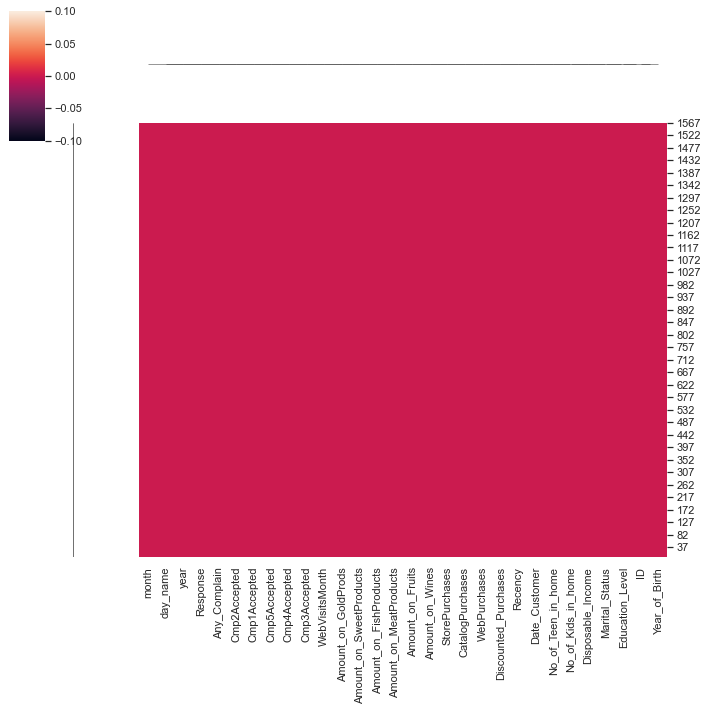

In [44]:
sns.clustermap(train.isnull(),)

In [45]:
train.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,year,day_name,month
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,...,0,0,0,0,0,0,0,2014,Sunday,June
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,...,0,0,0,0,0,0,0,2013,Tuesday,January
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,...,0,0,0,1,0,0,1,2013,Thursday,November
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,2013-09-13,49,3,...,0,0,0,0,0,0,0,2013,Friday,September
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,...,0,0,0,1,0,0,0,2014,Tuesday,January


In [46]:
train_1=train.drop('ID',axis=1)

In [47]:
train_1.head()

,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,...,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,year,day_name,month
0,1955,Graduation,Divorced,77504.4,1,1,2014-06-22,56,2,1,...,0,0,0,0,0,0,0,2014,Sunday,June
1,1958,Graduation,Together,56784.0,0,1,2013-01-08,17,6,5,...,0,0,0,0,0,0,0,2013,Tuesday,January
2,1962,Graduation,Single,103714.8,0,0,2013-11-21,17,0,7,...,0,0,0,1,0,0,1,2013,Thursday,November
3,1979,2n Cycle,Single,46311.6,1,0,2013-09-13,49,3,4,...,0,0,0,0,0,0,0,2013,Friday,September
4,1959,Graduation,Married,87486.0,0,0,2014-01-21,59,1,3,...,0,0,0,1,0,0,0,2014,Tuesday,January


In [48]:
train_1=pd.get_dummies(train_1,drop_first=True)

In [49]:
train_1

,Year_of_Birth,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,1955,77504.4,1,1,2014-06-22,56,2,1,1,4,...,0,0,0,0,1,0,0,0,0,0
1,1958,56784.0,0,1,2013-01-08,17,6,5,1,8,...,0,0,1,0,0,0,0,0,0,0
2,1962,103714.8,0,0,2013-11-21,17,0,7,4,7,...,0,0,0,0,0,0,0,1,0,0
3,1979,46311.6,1,0,2013-09-13,49,3,4,1,3,...,0,0,0,0,0,0,0,0,0,1
4,1959,87486.0,0,0,2014-01-21,59,1,3,7,9,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1563,1970,52893.6,1,1,2014-06-19,24,2,2,0,3,...,0,0,0,0,1,0,0,0,0,0
1564,1980,74190.0,0,1,2013-07-08,63,1,4,2,8,...,0,0,0,1,0,0,0,0,0,0
1565,1952,80857.2,0,1,2013-01-15,74,4,2,2,9,...,0,0,1,0,0,0,0,0,0,0
1566,1964,58701.6,1,1,2014-12-04,28,2,1,0,4,...,1,0,0,0,0,0,0,0,0,0


In [55]:
from sklearn.model_selection import train_test_split

In [56]:
X=train_1.drop([target[0],'Date_Customer',check[1],check[2]],axis=1)
y=train['Response']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=2)

In [57]:
from sklearn.ensemble import RandomForestClassifier

In [58]:
random=RandomForestClassifier(n_estimators=1500,max_depth=150)

In [59]:
random.fit(X_train,y_train)

RandomForestClassifier(max_depth=150, n_estimators=1500)

In [60]:
predict=random.predict(X_test)

In [61]:
from sklearn.metrics import classification_report ,confusion_matrix 

In [62]:
print(classification_report(y_test,predict))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94       333
           1       0.81      0.37      0.51        59

    accuracy                           0.89       392
   macro avg       0.86      0.68      0.73       392
weighted avg       0.89      0.89      0.88       392



In [63]:
test_1=test.drop('ID',axis=1)
test_1=pd.get_dummies(test_1,drop_first=True)

In [64]:
check=[col for col in train_1.columns if col not in test_1.columns]

In [65]:
check

['Response', 'Marital_Status_Alone', 'Marital_Status_YOLO']

In [66]:
X_train.columns

Index(['Year_of_Birth', 'Disposable_Income', 'No_of_Kids_in_home',
       'No_of_Teen_in_home', 'Recency', 'Discounted_Purchases', 'WebPurchases',
       'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines',
       'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'year', 'Education_Level_Basic',
       'Education_Level_Graduation', 'Education_Level_Master',
       'Education_Level_PhD', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Marital_Status_Together', 'Marital_Status_Widow', 'day_name_Monday',
       'day_name_Saturday', 'day_name_Sunday', 'day_name_Thursday',
       'day_name_Tuesday', 'day_name_Wednesday', 'month_August',
       'month_December', 'month_February', 'month_January', 'month_July',
       'month_June', 'month_Ma

In [75]:
len(test.columns)

29

In [82]:
delete=[col for col in test_1.columns if col not in X_train.columns]

In [84]:
test_predict=test_1.drop(delete[0],axis=1)

In [87]:
len(X_train.columns)

49

In [92]:
test_predict['Disposable_Income']=test_predict[['Disposable_Income','year']].apply(Dispose,axis=1)

In [94]:
test_predict.isnull().sum()

Year_of_Birth                 0
Disposable_Income             0
No_of_Kids_in_home            0
No_of_Teen_in_home            0
Recency                       0
Discounted_Purchases          0
WebPurchases                  0
CatalogPurchases              0
StorePurchases                0
Amount_on_Wines               0
Amount_on_Fruits              0
Amount_on_MeatProducts        0
Amount_on_FishProducts        0
Amount_on_SweetProducts       0
Amount_on_GoldProds           0
WebVisitsMonth                0
Cmp3Accepted                  0
Cmp4Accepted                  0
Cmp5Accepted                  0
Cmp1Accepted                  0
Cmp2Accepted                  0
Any_Complain                  0
year                          0
Education_Level_Basic         0
Education_Level_Graduation    0
Education_Level_Master        0
Education_Level_PhD           0
Marital_Status_Divorced       0
Marital_Status_Married        0
Marital_Status_Single         0
Marital_Status_Together       0
Marital_

In [95]:
final=random.predict(test_predict)

In [410]:
submit=submit.copy()
submit['Response']=final

In [411]:
submit

,ID,Response
0,ID_ZPMABNVX,0
1,ID_WFE91NAA,0
2,ID_JV11RBRK,0
3,ID_6B7SVKY9,0
4,ID_GOVUZ545,0
...,...,...
667,ID_1D68PV28,0
668,ID_TM6CYFZO,0
669,ID_VHR666SC,0
670,ID_O852YAO1,0


<AxesSubplot:xlabel='Response', ylabel='count'>

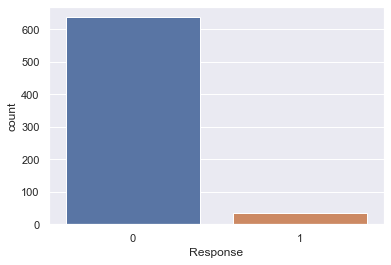

In [412]:
sns.countplot(x='Response',data=submit)

In [413]:
submit.to_csv('a3.csv',index=False,index_label=False)

In [96]:
from sklearn.linear_model import LogisticRegressionCV
log=LogisticRegressionCV(random_state=2,max_iter=1000)

In [97]:
log.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegressionCV(max_iter=1000, random_state=2)

In [98]:
lg_prd=log.predict(X_test)

In [99]:
print(classification_report(y_test,lg_prd))

              precision    recall  f1-score   support

           0       0.86      0.97      0.92       333
           1       0.47      0.14      0.21        59

    accuracy                           0.85       392
   macro avg       0.67      0.55      0.56       392
weighted avg       0.80      0.85      0.81       392



In [100]:
log_predict=log.predict(test_predict)

In [399]:
submit=submit.copy()

In [400]:
submit['Response']=log_predict

<AxesSubplot:xlabel='Response', ylabel='count'>

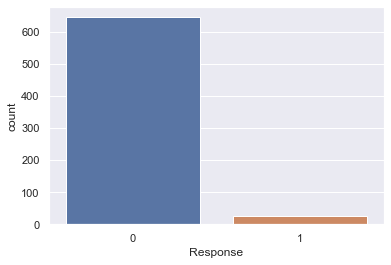

In [401]:
sns.countplot(x='Response',data=submit)

In [402]:
submit.to_csv('ai2.csv',index=False,index_label=False)

In [192]:
from xgboost import XGBRFClassifier
xg=XGBRFClassifier(learning_rate=1,scale_pos_weight=99)

In [193]:
xg.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=1, gamma=0, gpu_id=-1, importance_type='gain',
                interaction_constraints='', max_delta_step=0, max_depth=6,
                min_child_weight=1, missing=nan, monotone_constraints='()',
                n_estimators=100, n_jobs=4, num_parallel_tree=100,
                objective='binary:logistic', random_state=0, reg_alpha=0,
                scale_pos_weight=99, tree_method='exact', validate_parameters=1,
                verbosity=None)

In [194]:
xg_prd=xg.predict(X_test)

In [195]:
print(classification_report(y_test,xg_prd))

              precision    recall  f1-score   support

           0       0.96      0.47      0.63       333
           1       0.23      0.90      0.37        59

    accuracy                           0.53       392
   macro avg       0.60      0.68      0.50       392
weighted avg       0.85      0.53      0.59       392



In [196]:
from sklearn.metrics import f1_score

In [197]:
print(f1_score(y_test,xg_prd))

0.3655172413793104


In [198]:
xg_fin=xg.predict(test_predict)

In [199]:
submit=submit.copy()
submit['Response']=xg_fin

<AxesSubplot:xlabel='Response', ylabel='count'>

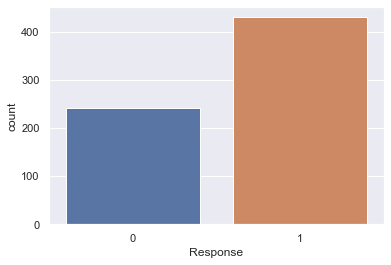

In [200]:
sns.countplot(x='Response',data=submit)

In [201]:
submit.to_csv('ai10.csv',index=False,index_label=False)

In [109]:
from lightgbm import LGBMClassifier
lgm=LGBMClassifier(n_estimators=500,max_depth=100,n_jobs=5,)

In [110]:
lgm.fit(X_train,y_train)

LGBMClassifier(max_depth=100, n_estimators=500, n_jobs=5)

In [111]:
lgm_pd=lgm.predict(X_test)

In [112]:
print(classification_report(y_test,lgm_pd))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93       333
           1       0.70      0.39      0.50        59

    accuracy                           0.88       392
   macro avg       0.80      0.68      0.72       392
weighted avg       0.87      0.88      0.87       392



In [113]:
print(f1_score(y_test,lgm_pd))

0.5


In [114]:
lgm_predict=lgm.predict(test_predict)

In [435]:
submit=submit.copy()
submit['Response']=lgm_predict

<AxesSubplot:xlabel='Response', ylabel='count'>

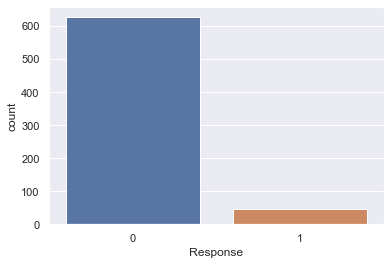

In [436]:
sns.countplot(x='Response',data=submit)

In [437]:
submit.to_csv('ai5.csv',index=False,index_label=False)

In [503]:
from xgboost import XGBClassifier
xgb=XGBClassifier(n_estimators=800,scale_pos_weight=99,)

In [504]:
xgb.fit(X_train,y_train)

[14:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=800, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=99, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [505]:
xgb_pred=xgb.predict(X_test)

In [506]:
print(classification_report(y_test,xgb_pred))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       333
           1       0.70      0.73      0.72        59

    accuracy                           0.91       392
   macro avg       0.83      0.84      0.83       392
weighted avg       0.91      0.91      0.91       392



In [507]:
xgb_fin=xgb.predict(test_predict)

In [508]:
submit=submit.copy()
submit['Response']=xgb_fin

<AxesSubplot:xlabel='Response', ylabel='count'>

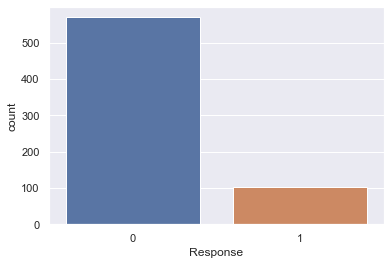

In [509]:
sns.countplot(x='Response',data=submit)

In [510]:
submit.to_csv('ai16.csv',index=False,index_label=False)

In [250]:
from sklearn.model_selection import GridSearchCV


In [251]:
param_grid={'scale_pos_weight':[1,10,25,50,75,99,200]}

In [252]:
param_grid

{'scale_pos_weight': [1, 10, 25, 50, 75, 99, 200]}

In [253]:
grid=GridSearchCV(estimator=xgb,param_grid=param_grid)

In [254]:
grid.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:26:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:26:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:26:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:26:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[13:27:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:27:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:27:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:27:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0, gpu_id=-1,
                                     importance_type='gain',
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=6,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=500, n_jobs=4,
                                     num_parallel_tree=1, random_state=0,
                                     reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=99, subsample=1,
                                     tree_method='exact', validate_parameters=1,
                           

In [255]:
grid_prd=grid.predict(X_test)

In [256]:
print(classification_report(y_test,grid_prd))

              precision    recall  f1-score   support

           0       0.92      0.98      0.95       333
           1       0.80      0.54      0.65        59

    accuracy                           0.91       392
   macro avg       0.86      0.76      0.80       392
weighted avg       0.90      0.91      0.90       392



In [257]:
grid_fin=grid.predict(test_predict)

In [259]:
submit=submit.copy()
submit['Response']=grid_fin

<AxesSubplot:xlabel='Response', ylabel='count'>

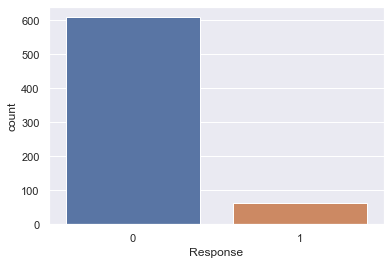

In [260]:
sns.countplot(x='Response',data=submit)

In [261]:
from sklearn.ensemble import StackingClassifier


In [291]:
estimator=[('random',random),
          
          
          
          ('xgb',xgb),
          ]

In [292]:
stack=StackingClassifier(estimators=estimator)

In [293]:
stack.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:49:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:49:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:49:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:49:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:49:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

StackingClassifier(estimators=[('random',
                                RandomForestClassifier(max_depth=150,
                                                       n_estimators=1500)),
                               ('xgb',
                                XGBClassifier(base_score=0.5, booster='gbtree',
                                              colsample_bylevel=1,
                                              colsample_bynode=1,
                                              colsample_bytree=1, gamma=0,
                                              gpu_id=-1, importance_type='gain',
                                              interaction_constraints='',
                                              learning_rate=0.300000012,
                                              max_delta_step=0, max_depth=6,
                                              min_child_weight=1, missing=nan,
                                              monotone_constraints='()',
                            

In [294]:
predict_stac=stack.predict(X_test)

In [295]:
print(classification_report(y_test,predict_stac))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       333
           1       0.76      0.47      0.58        59

    accuracy                           0.90       392
   macro avg       0.83      0.72      0.76       392
weighted avg       0.89      0.90      0.89       392



In [405]:
from catboost import CatBoostClassifier
cat=CatBoostClassifier(scale_pos_weight=16)
cat.fit(X_train,y_train)

Learning rate set to 0.011041
0:	learn: 0.6881214	total: 14.4ms	remaining: 14.4s
1:	learn: 0.6833768	total: 23ms	remaining: 11.5s
2:	learn: 0.6782969	total: 31.8ms	remaining: 10.6s
3:	learn: 0.6729759	total: 40.4ms	remaining: 10.1s
4:	learn: 0.6691701	total: 48.5ms	remaining: 9.65s
5:	learn: 0.6643327	total: 52.6ms	remaining: 8.72s
6:	learn: 0.6599517	total: 56.8ms	remaining: 8.05s
7:	learn: 0.6553392	total: 60.9ms	remaining: 7.54s
8:	learn: 0.6508207	total: 65ms	remaining: 7.16s
9:	learn: 0.6472674	total: 68.9ms	remaining: 6.83s
10:	learn: 0.6431265	total: 73ms	remaining: 6.57s
11:	learn: 0.6386071	total: 77.2ms	remaining: 6.36s
12:	learn: 0.6344986	total: 81.3ms	remaining: 6.17s
13:	learn: 0.6299402	total: 85.4ms	remaining: 6.01s
14:	learn: 0.6251309	total: 89.3ms	remaining: 5.86s
15:	learn: 0.6205615	total: 93.1ms	remaining: 5.73s
16:	learn: 0.6160683	total: 97.1ms	remaining: 5.62s
17:	learn: 0.6118710	total: 101ms	remaining: 5.51s
18:	learn: 0.6088393	total: 105ms	remaining: 5.42s


173:	learn: 0.3466043	total: 831ms	remaining: 3.94s
174:	learn: 0.3457786	total: 835ms	remaining: 3.94s
175:	learn: 0.3448987	total: 839ms	remaining: 3.93s
176:	learn: 0.3444272	total: 846ms	remaining: 3.93s
177:	learn: 0.3433083	total: 850ms	remaining: 3.93s
178:	learn: 0.3429838	total: 855ms	remaining: 3.92s
179:	learn: 0.3421872	total: 859ms	remaining: 3.91s
180:	learn: 0.3415839	total: 868ms	remaining: 3.93s
181:	learn: 0.3409391	total: 878ms	remaining: 3.94s
182:	learn: 0.3403087	total: 882ms	remaining: 3.94s
183:	learn: 0.3393447	total: 886ms	remaining: 3.93s
184:	learn: 0.3385786	total: 896ms	remaining: 3.95s
185:	learn: 0.3381709	total: 900ms	remaining: 3.94s
186:	learn: 0.3374516	total: 904ms	remaining: 3.93s
187:	learn: 0.3367863	total: 907ms	remaining: 3.92s
188:	learn: 0.3362437	total: 914ms	remaining: 3.92s
189:	learn: 0.3355578	total: 918ms	remaining: 3.92s
190:	learn: 0.3349247	total: 922ms	remaining: 3.91s
191:	learn: 0.3339448	total: 926ms	remaining: 3.9s
192:	learn: 0

336:	learn: 0.2577987	total: 1.51s	remaining: 2.97s
337:	learn: 0.2575813	total: 1.51s	remaining: 2.96s
338:	learn: 0.2570627	total: 1.52s	remaining: 2.96s
339:	learn: 0.2566769	total: 1.52s	remaining: 2.95s
340:	learn: 0.2564619	total: 1.53s	remaining: 2.95s
341:	learn: 0.2560247	total: 1.53s	remaining: 2.94s
342:	learn: 0.2556611	total: 1.53s	remaining: 2.94s
343:	learn: 0.2553805	total: 1.54s	remaining: 2.93s
344:	learn: 0.2547178	total: 1.54s	remaining: 2.93s
345:	learn: 0.2543631	total: 1.55s	remaining: 2.92s
346:	learn: 0.2540944	total: 1.55s	remaining: 2.92s
347:	learn: 0.2537831	total: 1.55s	remaining: 2.91s
348:	learn: 0.2535635	total: 1.56s	remaining: 2.91s
349:	learn: 0.2532597	total: 1.56s	remaining: 2.9s
350:	learn: 0.2529449	total: 1.57s	remaining: 2.9s
351:	learn: 0.2527011	total: 1.57s	remaining: 2.89s
352:	learn: 0.2522774	total: 1.57s	remaining: 2.89s
353:	learn: 0.2519033	total: 1.58s	remaining: 2.88s
354:	learn: 0.2517184	total: 1.58s	remaining: 2.88s
355:	learn: 0.

531:	learn: 0.1977358	total: 2.35s	remaining: 2.07s
532:	learn: 0.1976200	total: 2.35s	remaining: 2.06s
533:	learn: 0.1973881	total: 2.36s	remaining: 2.06s
534:	learn: 0.1971362	total: 2.36s	remaining: 2.06s
535:	learn: 0.1968499	total: 2.37s	remaining: 2.05s
536:	learn: 0.1965876	total: 2.37s	remaining: 2.04s
537:	learn: 0.1963640	total: 2.38s	remaining: 2.04s
538:	learn: 0.1962767	total: 2.38s	remaining: 2.04s
539:	learn: 0.1961716	total: 2.38s	remaining: 2.03s
540:	learn: 0.1959799	total: 2.39s	remaining: 2.02s
541:	learn: 0.1957954	total: 2.39s	remaining: 2.02s
542:	learn: 0.1956212	total: 2.4s	remaining: 2.02s
543:	learn: 0.1951964	total: 2.4s	remaining: 2.01s
544:	learn: 0.1948869	total: 2.4s	remaining: 2.01s
545:	learn: 0.1947011	total: 2.41s	remaining: 2s
546:	learn: 0.1944397	total: 2.41s	remaining: 2s
547:	learn: 0.1941466	total: 2.41s	remaining: 1.99s
548:	learn: 0.1937916	total: 2.42s	remaining: 1.99s
549:	learn: 0.1935988	total: 2.42s	remaining: 1.98s
550:	learn: 0.1933119

704:	learn: 0.1588436	total: 3.03s	remaining: 1.27s
705:	learn: 0.1586921	total: 3.04s	remaining: 1.26s
706:	learn: 0.1584548	total: 3.04s	remaining: 1.26s
707:	learn: 0.1581944	total: 3.04s	remaining: 1.25s
708:	learn: 0.1579391	total: 3.05s	remaining: 1.25s
709:	learn: 0.1578410	total: 3.05s	remaining: 1.25s
710:	learn: 0.1577170	total: 3.06s	remaining: 1.24s
711:	learn: 0.1574047	total: 3.06s	remaining: 1.24s
712:	learn: 0.1571784	total: 3.06s	remaining: 1.23s
713:	learn: 0.1569853	total: 3.07s	remaining: 1.23s
714:	learn: 0.1567432	total: 3.07s	remaining: 1.22s
715:	learn: 0.1565638	total: 3.08s	remaining: 1.22s
716:	learn: 0.1564315	total: 3.08s	remaining: 1.22s
717:	learn: 0.1561650	total: 3.08s	remaining: 1.21s
718:	learn: 0.1559769	total: 3.09s	remaining: 1.21s
719:	learn: 0.1557507	total: 3.09s	remaining: 1.2s
720:	learn: 0.1556937	total: 3.09s	remaining: 1.2s
721:	learn: 0.1555535	total: 3.1s	remaining: 1.19s
722:	learn: 0.1553099	total: 3.1s	remaining: 1.19s
723:	learn: 0.15

878:	learn: 0.1306354	total: 3.7s	remaining: 510ms
879:	learn: 0.1305198	total: 3.71s	remaining: 505ms
880:	learn: 0.1304807	total: 3.71s	remaining: 501ms
881:	learn: 0.1302462	total: 3.71s	remaining: 497ms
882:	learn: 0.1299973	total: 3.72s	remaining: 493ms
883:	learn: 0.1299170	total: 3.72s	remaining: 489ms
884:	learn: 0.1298191	total: 3.73s	remaining: 484ms
885:	learn: 0.1296485	total: 3.73s	remaining: 480ms
886:	learn: 0.1296317	total: 3.73s	remaining: 476ms
887:	learn: 0.1294120	total: 3.74s	remaining: 472ms
888:	learn: 0.1292727	total: 3.74s	remaining: 467ms
889:	learn: 0.1291828	total: 3.75s	remaining: 463ms
890:	learn: 0.1289597	total: 3.75s	remaining: 459ms
891:	learn: 0.1289514	total: 3.75s	remaining: 455ms
892:	learn: 0.1288055	total: 3.76s	remaining: 450ms
893:	learn: 0.1287381	total: 3.76s	remaining: 446ms
894:	learn: 0.1286182	total: 3.77s	remaining: 442ms
895:	learn: 0.1285547	total: 3.77s	remaining: 438ms
896:	learn: 0.1284024	total: 3.77s	remaining: 433ms
897:	learn: 0

In [406]:
cat_pd=cat.predict(X_test)

In [407]:
print(classification_report(y_test,cat_pd))

              precision    recall  f1-score   support

           0       0.97      0.86      0.91       333
           1       0.51      0.83      0.63        59

    accuracy                           0.85       392
   macro avg       0.74      0.84      0.77       392
weighted avg       0.90      0.85      0.87       392



In [512]:
X

,Year_of_Birth,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,...,month_December,month_February,month_January,month_July,month_June,month_March,month_May,month_November,month_October,month_September
0,1955,77504.4,1,1,56,2,1,1,4,71,...,0,0,0,0,1,0,0,0,0,0
1,1958,56784.0,0,1,17,6,5,1,8,205,...,0,0,1,0,0,0,0,0,0,0
2,1962,103714.8,0,0,17,0,7,4,7,469,...,0,0,0,0,0,0,0,1,0,0
3,1979,46311.6,1,0,49,3,4,1,3,56,...,0,0,0,0,0,0,0,0,0,1
4,1959,87486.0,0,0,59,1,3,7,9,412,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1563,1970,52893.6,1,1,24,2,2,0,3,29,...,0,0,0,0,1,0,0,0,0,0
1564,1980,74190.0,0,1,63,1,4,2,8,167,...,0,0,0,1,0,0,0,0,0,0
1565,1952,80857.2,0,1,74,4,2,2,9,820,...,0,0,1,0,0,0,0,0,0,0
1566,1964,58701.6,1,1,28,2,1,0,4,57,...,1,0,0,0,0,0,0,0,0,0


In [671]:
from sklearn.preprocessing import MinMaxScaler
stand=MinMaxScaler()

In [672]:
train_1=pd.DataFrame(stand.fit_transform(X),columns=X.columns)

In [673]:
test_1=pd.DataFrame(stand.fit_transform(test_predict),columns=test_predict.columns)

In [674]:
from xgboost import XGBClassifier
xgb_prp=XGBClassifier(n_estimators=100,scale_pos_weight=1,)

In [726]:
X=train_1
y=train['Response']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [727]:
xgb_prp.fit(X_train,y_train)

[20:43:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [728]:
prd_=xgb_prp.predict(X_test)

In [729]:
print(classification_report(y_test,prd_))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93       342
           1       0.52      0.44      0.48        50

    accuracy                           0.88       392
   macro avg       0.72      0.69      0.70       392
weighted avg       0.87      0.88      0.87       392



In [730]:
fit=xgb_prp.predict(test_1)

In [731]:
submit=submit.copy()
submit['Response']=fit

<AxesSubplot:xlabel='Response', ylabel='count'>

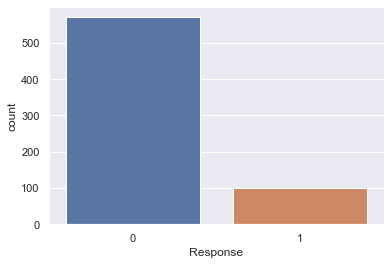

In [732]:
sns.countplot(x='Response',data=submit)